In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import random
import itertools

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors

from GraphRicciCurvature.OllivierRicci import OllivierRicci
from GraphRicciCurvature.FormanRicci import FormanRicci


In [2]:
# Create the graph
G = nx.karate_club_graph()
for (n1, n2, d) in G.edges(data=True):
    d.clear()   # remove edge weight

# Generate positions
pos = nx.spring_layout(G, seed=42)  # deterministic layout

# Optionally store positions as node attributes
nx.set_node_attributes(G, pos, 'pos')

print(G)

Graph named "Zachary's Karate Club" with 34 nodes and 78 edges


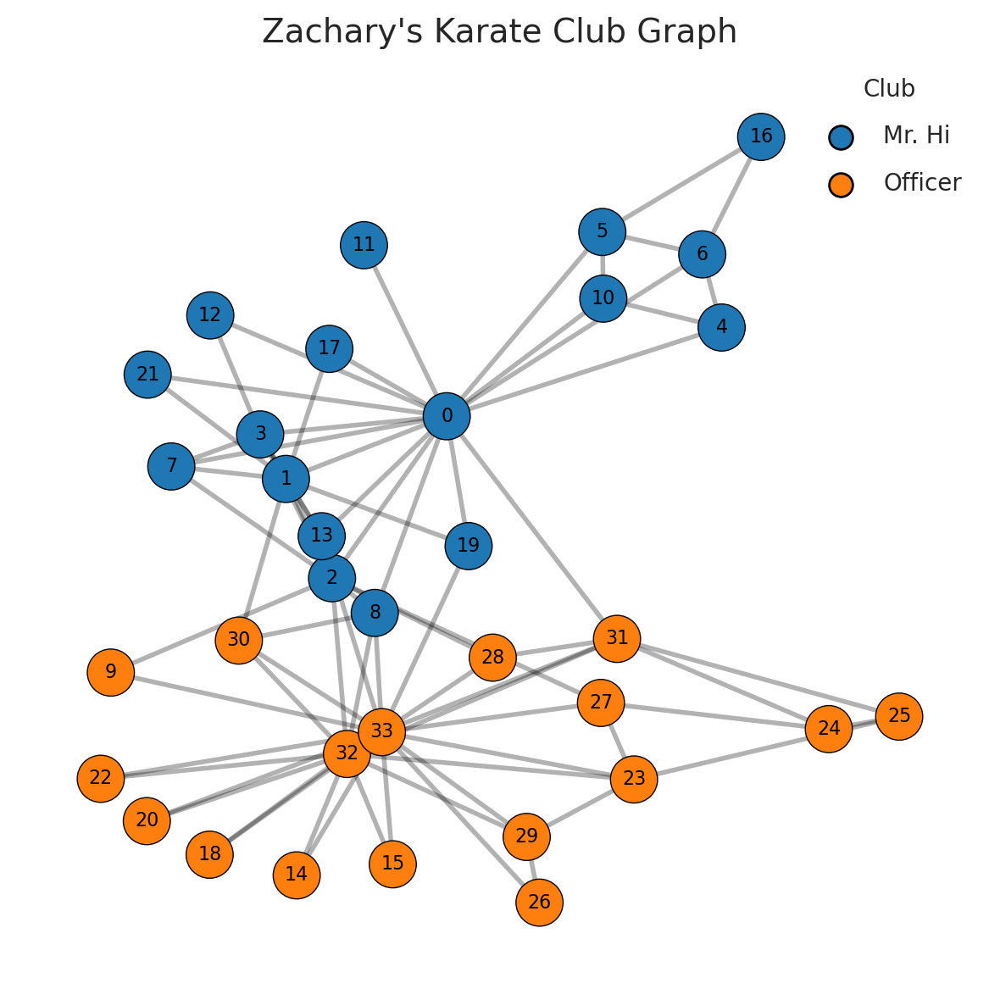

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

# Prepare node colors based on club membership
club_colors = {"Mr. Hi": "#1f77b4", "Officer": "#ff7f0e"}
node_colors = [club_colors[G.nodes[n]["club"]] for n in G.nodes()]

# Draw the network
nx.draw_networkx_edges(G, pos, alpha=0.3, width=2)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, edgecolors="black", linewidths=0.5, node_size=400)
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Legend
for label, color in club_colors.items():
    plt.scatter([], [], c=color, label=label, s=100, edgecolors='black')
plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title="Club")

plt.axis("off")
plt.title("Zachary's Karate Club Graph", fontsize=14)
plt.tight_layout()
plt.show()

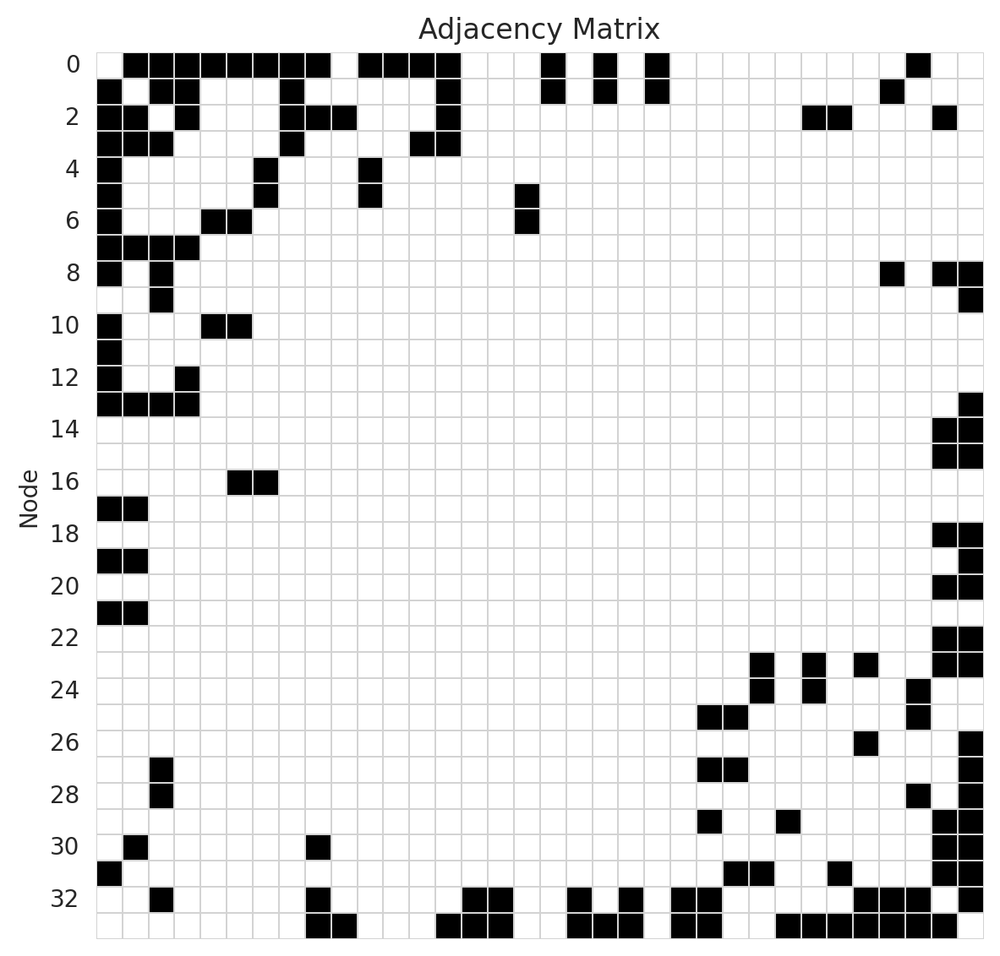

In [4]:
# Get binary adjacency matrix as NumPy array
A = nx.to_numpy_array(G, dtype=int)

# Plot using seaborn
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sns.heatmap(
    A, cmap="Greys", 
    cbar=False, square=True,
    linewidths=0.1,
    linecolor='lightgray')

plt.title("Adjacency Matrix")
plt.xlabel("")
plt.ylabel("Node")
plt.tight_layout()
plt.gca().tick_params(axis='y', rotation=0)
plt.xticks([])
plt.show()

# Compute Ollivier

CPU times: user 78.1 ms, sys: 601 ms, total: 679 ms
Wall time: 1.26 s


Text(0.5, 1.0, 'Histogram of Ricci Curvatures')

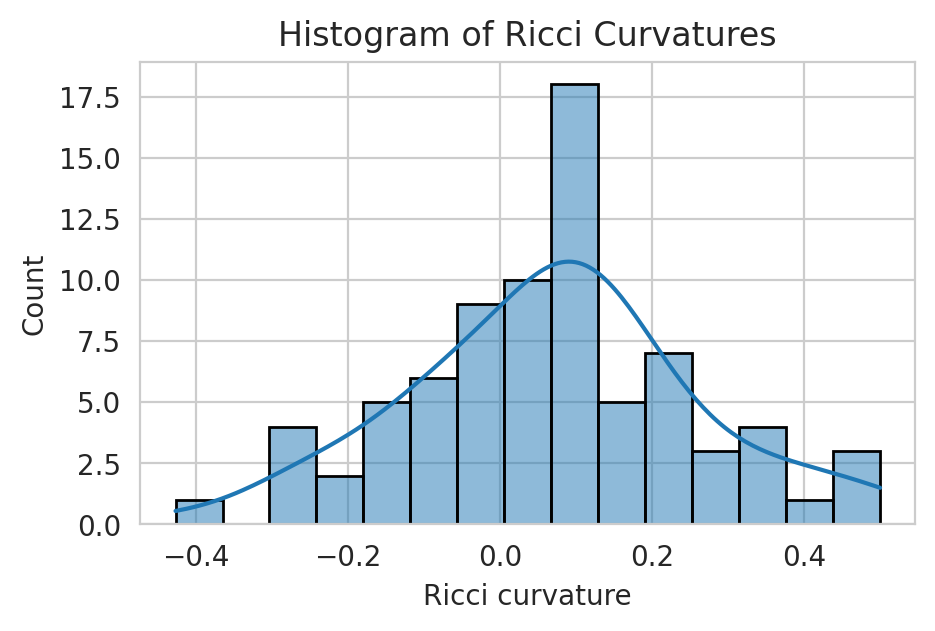

In [5]:
%%time
orc = OllivierRicci(G, alpha=0.5)
orc.compute_ricci_curvature()

key = 'ricciCurvature'
ricci_curvtures = nx.get_edge_attributes(orc.G, key).values()

# Plot using seaborn
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3

sns.histplot(
    ricci_curvtures,
    bins=15,
    kde=True,
    legend=False,
    ec='k',
)

plt.xlabel('Ricci curvature')
plt.title("Histogram of Ricci Curvatures")

/tmp/ipykernel_2985866/3808593159.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("coolwarm")  # diverging colormap


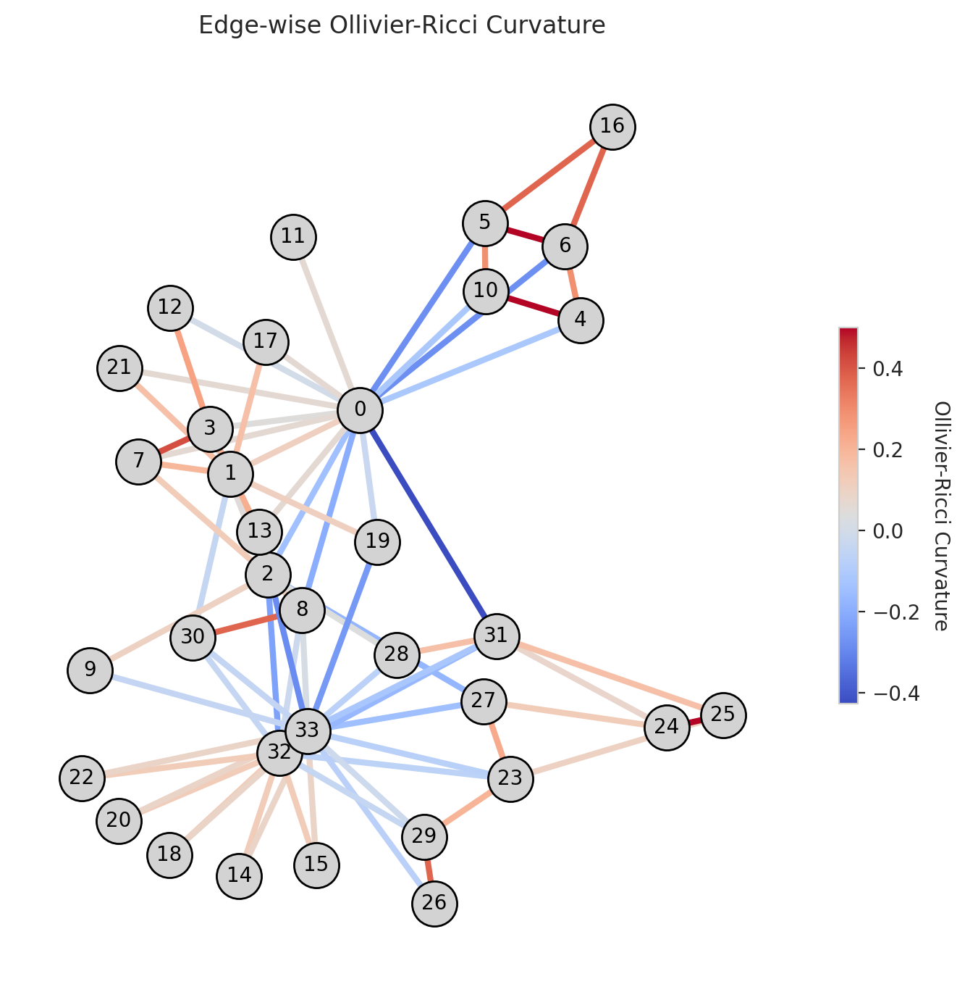

In [6]:
# Extract curvature values
key = 'ricciCurvature'
edge_curvatures = nx.get_edge_attributes(orc.G, key)
curv_values = list(edge_curvatures.values())


vmin, vmax = min(curv_values), max(curv_values)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cm.get_cmap("coolwarm")  # diverging colormap

# Assign color to each edge
edge_colors = [cmap(norm(edge_curvatures[e])) for e in G.edges()]

# Plot using seaborn
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 7

fig, ax = plt.subplots()
nx.draw_networkx_nodes(G, pos, node_color="lightgray", edgecolors="black", node_size=500, ax=ax)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=3, ax=ax)
nx.draw_networkx_labels(G, pos, font_size=10, ax=ax)

# Add colorbar with Axes context
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.4)
cbar.set_label("Ollivier-Ricci Curvature", rotation=270, labelpad=15)

ax.set_title("Edge-wise Ollivier-Ricci Curvature")
ax.axis("off")
plt.tight_layout()
plt.show()

#  Eigenvector Centrality

/tmp/ipykernel_2985866/78302605.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_c = cm.get_cmap("coolwarm")  # diverging colormap
/tmp/ipykernel_2985866/78302605.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_e = cm.get_cmap("viridis")


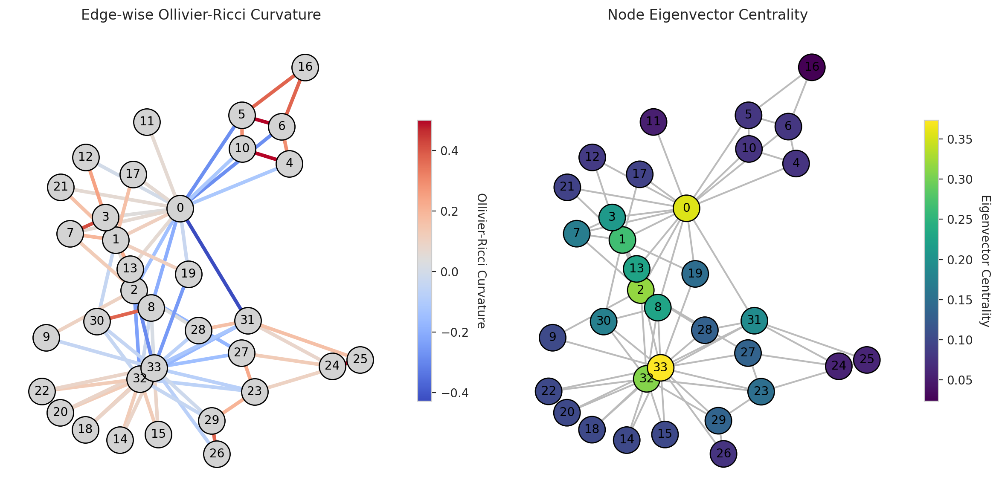

In [7]:
def plot_curvature_and_centrality(G, pos, orc_G, suptitle=None):
    """
    Plot Ollivier-Ricci curvature (edges) and eigenvector centrality (nodes)
    side-by-side for a given graph.

    Parameters
    ----------
    G : networkx.Graph
        Graph to plot.
    pos : dict
        Node position dictionary for plotting.
    orc_G : networkx.Graph
        Graph with 'ricciCurvature' values in edge attributes.
    suptitle : str, optional
        Overall figure title placed above both subplots.
    """
    # --- Curvature values ---
    key = 'ricciCurvature'
    edge_curvatures = nx.get_edge_attributes(orc_G, key)
    curv_values = list(edge_curvatures.values())

    vmin_c, vmax_c = min(curv_values), max(curv_values)
    norm_c = colors.Normalize(vmin=vmin_c, vmax=vmax_c)
    cmap_c = cm.get_cmap("coolwarm")  # diverging colormap
    edge_colors = [cmap_c(norm_c(edge_curvatures[e])) for e in G.edges()]

    # --- Eigenvector centrality ---
    try:
        ec = nx.eigenvector_centrality(G, max_iter=1000)
    except nx.PowerIterationFailedConvergence:
        ec = nx.eigenvector_centrality_numpy(G)

    ec_vals = np.array([ec[n] for n in G.nodes()])
    vmin_e, vmax_e = ec_vals.min(), ec_vals.max()
    norm_e = colors.Normalize(vmin=vmin_e, vmax=vmax_e)
    cmap_e = cm.get_cmap("viridis")
    node_colors = [cmap_e(norm_e(ec[n])) for n in G.nodes()]

    # --- Two column layout ---
    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = (12, 6)

    fig, axes = plt.subplots(1, 2)

    # --- Left plot: Curvature ---
    ax = axes[0]
    nx.draw_networkx_nodes(G, pos, node_color="lightgray", edgecolors="black",
                           node_size=500, ax=ax)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=3, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax)
    sm_c = cm.ScalarMappable(cmap=cmap_c, norm=norm_c)
    sm_c.set_array([])
    cbar_c = fig.colorbar(sm_c, ax=ax, shrink=0.6)
    cbar_c.set_label("Ollivier-Ricci Curvature", rotation=270, labelpad=15)
    ax.set_title("Edge-wise Ollivier-Ricci Curvature")
    ax.axis("off")

    # --- Right plot: Eigenvector Centrality ---
    ax = axes[1]
    nx.draw_networkx_edges(G, pos, edge_color="#bbbbbb", width=1.5, ax=ax)
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, edgecolors="black",
                           node_size=500, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax)
    sm_e = cm.ScalarMappable(cmap=cmap_e, norm=norm_e)
    sm_e.set_array([])
    cbar_e = fig.colorbar(sm_e, ax=ax, shrink=0.6)
    cbar_e.set_label("Eigenvector Centrality", rotation=270, labelpad=15)
    ax.set_title("Node Eigenvector Centrality")
    ax.axis("off")

    # Add optional overall title
    if suptitle:
        fig.suptitle(suptitle, fontsize=14, y=1.02)

    plt.tight_layout()
    plt.show()

plot_curvature_and_centrality(G, pos, orc.G)

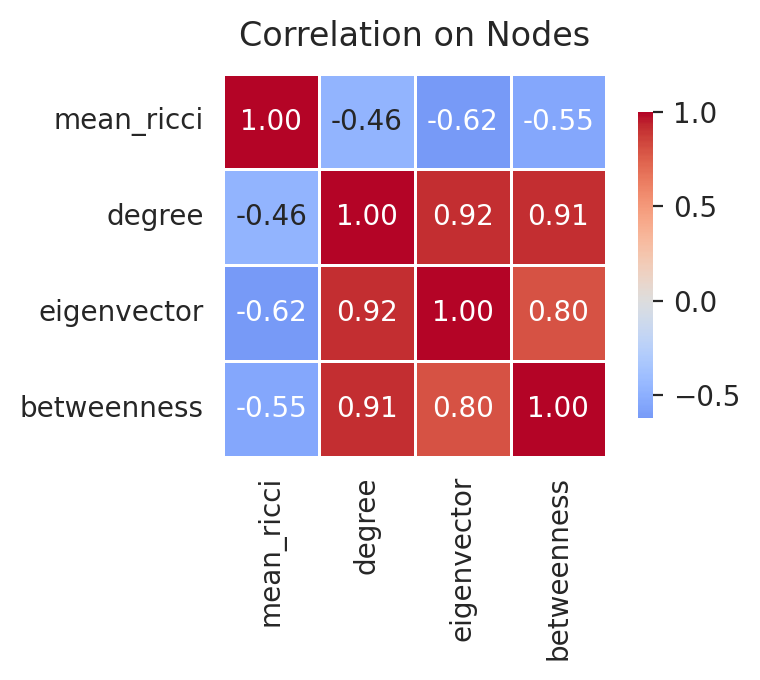

In [8]:
def node_metrics_with_mean_ricci(
    G: nx.Graph,
    *,
    curvature_graph: nx.Graph | None = None,
    curvature_key: str = "ricciCurvature",
    betweenness_weight: str | None = None,
    eigen_max_iter: int = 1000,
) -> pd.DataFrame:
    """
    For each node, define its Ricci curvature as the mean of the Ricci curvature
    over all incident edges (i.e., edges to its neighbors). Return a DataFrame
    with: mean_ricci, degree, eigenvector_centrality, betweenness_centrality.

    Parameters
    ----------
    G : nx.Graph
        Graph whose nodes to summarize.
    curvature_graph : nx.Graph | None
        Graph containing edge attribute `curvature_key`. Defaults to `G`.
    curvature_key : str
        Edge attribute name holding Ollivier–Ricci curvature values.
    betweenness_weight : str | None
        Edge attribute to use as weight for betweenness_centrality (None = unweighted).
    eigen_max_iter : int
        Max iterations for eigenvector centrality power method.

    Returns
    -------
    pd.DataFrame
        Index = node; columns = ['mean_ricci','degree','eigenvector','betweenness'].
    """
    CG = curvature_graph if curvature_graph is not None else G

    # Pull curvature dict once for speed
    edge_curv = nx.get_edge_attributes(CG, curvature_key)

    def _edge_curv(u, v):
        # Handle undirected key ordering robustly
        return edge_curv.get((u, v), edge_curv.get((v, u), np.nan))

    # Mean Ricci per node
    mean_ricci = {}
    for n in G.nodes():
        nbrs = list(G.neighbors(n))
        vals = [ _edge_curv(n, nbr) for nbr in nbrs ]
        vals = [x for x in vals if not np.isnan(x)]
        mean_ricci[n] = float(np.mean(vals)) if len(vals) else np.nan

    # Degree (simple, unweighted)
    deg = dict(G.degree())

    # Eigenvector centrality (fallback to numpy if needed)
    try:
        eig = nx.eigenvector_centrality(G, max_iter=eigen_max_iter)
    except nx.PowerIterationFailedConvergence:
        eig = nx.eigenvector_centrality_numpy(G)

    # Betweenness centrality
    btw = nx.betweenness_centrality(G, weight=betweenness_weight, normalized=True)

    # Assemble DataFrame
    df = pd.DataFrame({
        "mean_ricci": pd.Series(mean_ricci),
        "degree": pd.Series(deg),
        "eigenvector": pd.Series(eig),
        "betweenness": pd.Series(btw),
    }).astype({"degree": "int64"}, errors="ignore")

    return df

# If your curvature lives on orc.G edges under 'ricciCurvature':
df = node_metrics_with_mean_ricci(G, curvature_graph=orc.G)

# Compute correlation matrix
corr = df.corr()

plt.rcParams['figure.dpi'] = 200
plt.figure(figsize=(4.5, 3.5))
sns.heatmap(
    corr,
    annot=True,            
    fmt=".2f",             
    cmap="coolwarm",       
    center=0,             
    square=True,  
    lw=1,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation on Nodes", pad=10)
plt.tight_layout()
plt.show()

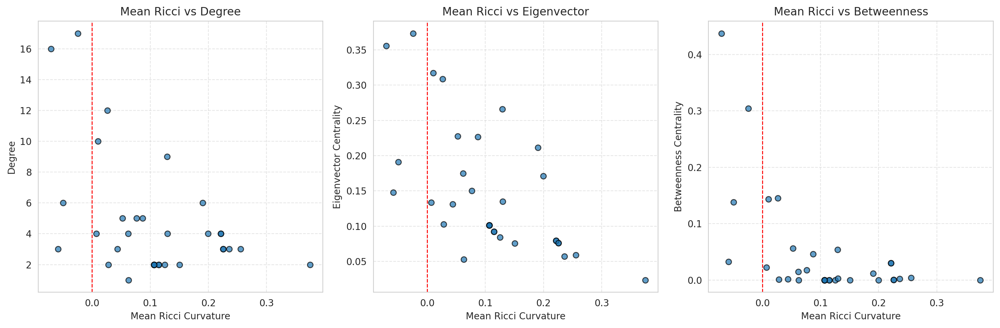

In [9]:
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["mean_ricci", "degree", "eigenvector", "betweenness"])

plt.rcParams['figure.dpi'] = 200
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Mean Ricci vs Degree
axes[0].scatter(df["mean_ricci"], df["degree"], alpha=0.7, edgecolor="k")
axes[0].axvline(0, color="red", linestyle="--", linewidth=1)
axes[0].set_xlabel("Mean Ricci Curvature")
axes[0].set_ylabel("Degree")
axes[0].set_title("Mean Ricci vs Degree")
axes[0].grid(True, linestyle="--", alpha=0.5)

# Mean Ricci vs Eigenvector centrality
axes[1].scatter(df["mean_ricci"], df["eigenvector"], alpha=0.7, edgecolor="k")
axes[1].axvline(0, color="red", linestyle="--", linewidth=1)
axes[1].set_xlabel("Mean Ricci Curvature")
axes[1].set_ylabel("Eigenvector Centrality")
axes[1].set_title("Mean Ricci vs Eigenvector")
axes[1].grid(True, linestyle="--", alpha=0.5)

# Mean Ricci vs Betweenness centrality
axes[2].scatter(df["mean_ricci"], df["betweenness"], alpha=0.7, edgecolor="k")
axes[2].axvline(0, color="red", linestyle="--", linewidth=1)
axes[2].set_xlabel("Mean Ricci Curvature")
axes[2].set_ylabel("Betweenness Centrality")
axes[2].set_title("Mean Ricci vs Betweenness")
axes[2].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

# Different Graph Structures

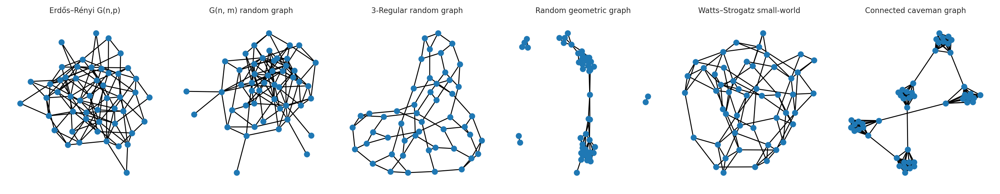

In [10]:
# Dictionary of graph generators
graph_types = {
    "Erdős–Rényi G(n,p)": lambda: nx.gnp_random_graph(n=50, p=0.1, seed=42),
    "G(n, m) random graph": lambda: nx.gnm_random_graph(n=50, m=125, seed=42),
    "3-Regular random graph": lambda: nx.random_regular_graph(d=3, n=50, seed=42),
    "Random geometric graph": lambda: nx.random_geometric_graph(n=50, radius=0.2, seed=42),
    "Watts–Strogatz small-world": lambda: nx.watts_strogatz_graph(n=50, k=4, p=0.3, seed=42),
    "Connected caveman graph": lambda: nx.connected_caveman_graph(l=5, k=10),
}

plt.rcParams['figure.dpi'] = 200
fig, axes = plt.subplots(1, len(graph_types), figsize=(15, 3))

graphs = {}

for ax, (label, generator) in zip(axes, graph_types.items()):
    G = generator()
    if "pos" in nx.get_node_attributes(G, "pos"):
        pos = nx.get_node_attributes(G, "pos")
    else:
        pos = nx.spring_layout(G, seed=42)

    G.pos = pos
    graphs[label] = G
    nx.draw(G, pos, node_size=30, ax=ax)
    ax.set_title(label, fontsize=8)
    ax.axis("off")


plt.tight_layout()
plt.show()

Erdős–Rényi G(n,p)


/tmp/ipykernel_2985866/78302605.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_c = cm.get_cmap("coolwarm")  # diverging colormap
/tmp/ipykernel_2985866/78302605.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_e = cm.get_cmap("viridis")


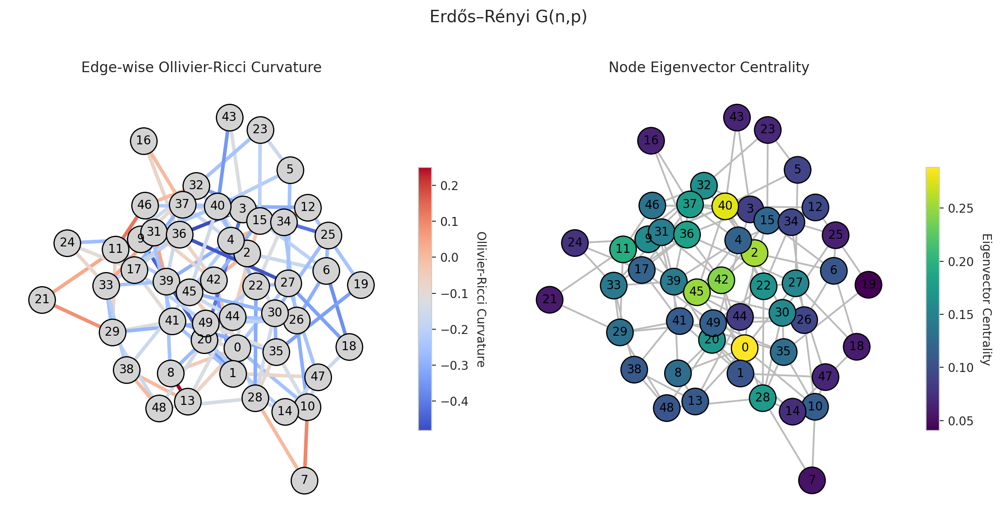

G(n, m) random graph


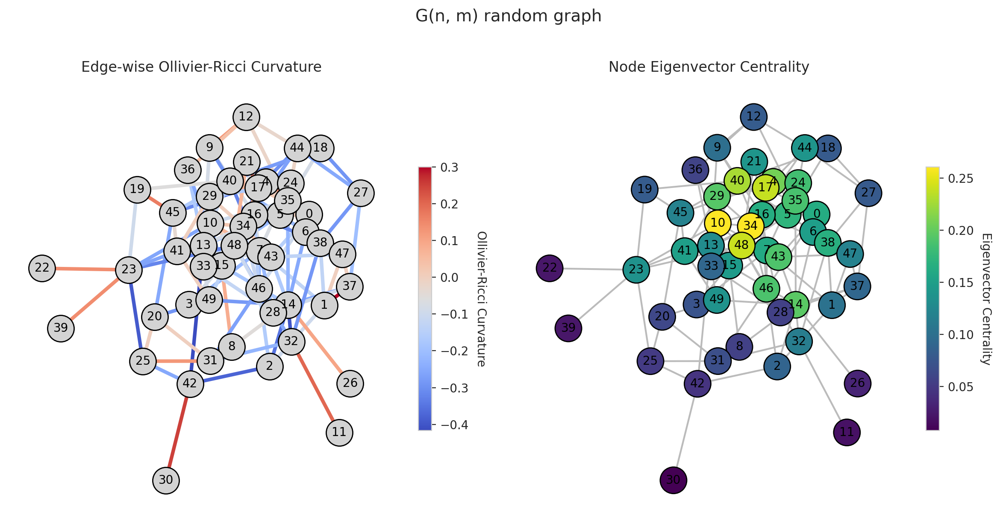

3-Regular random graph


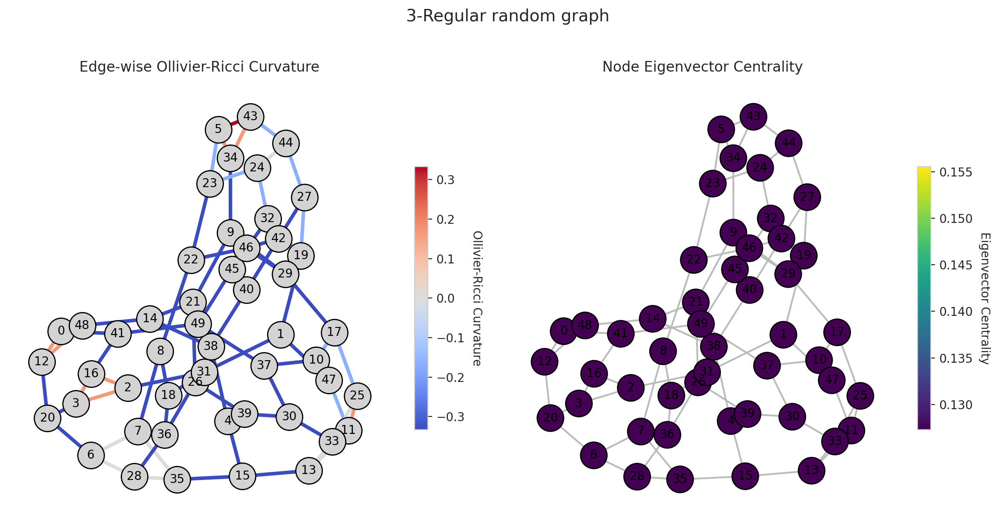

Random geometric graph


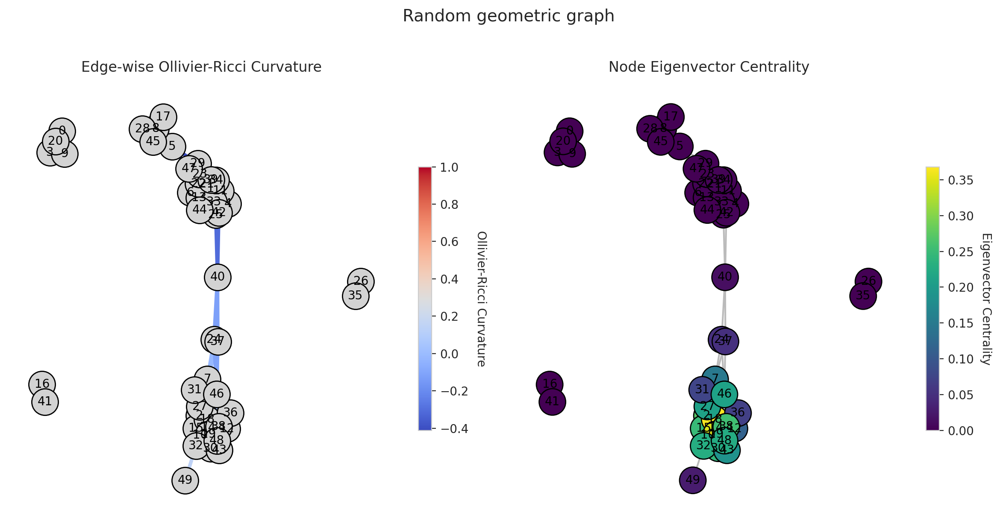

Watts–Strogatz small-world


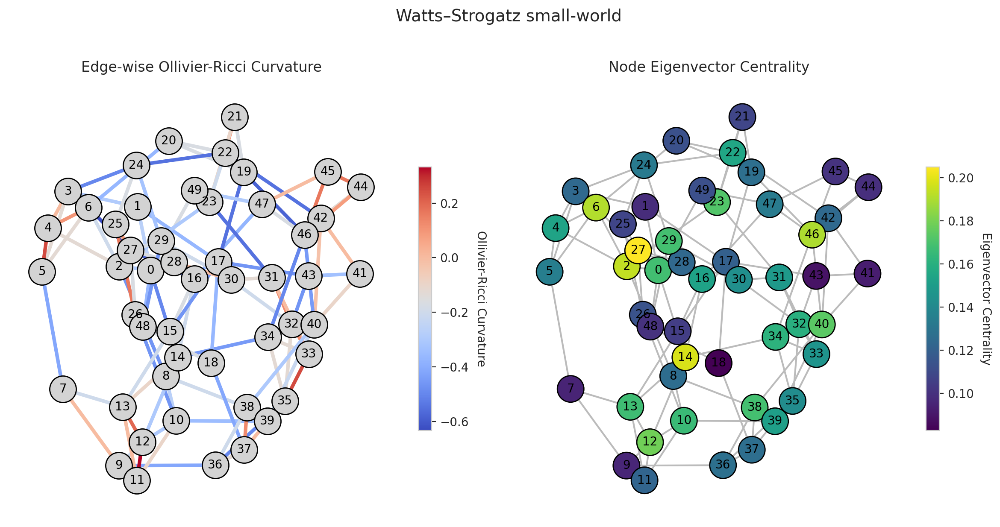

Connected caveman graph


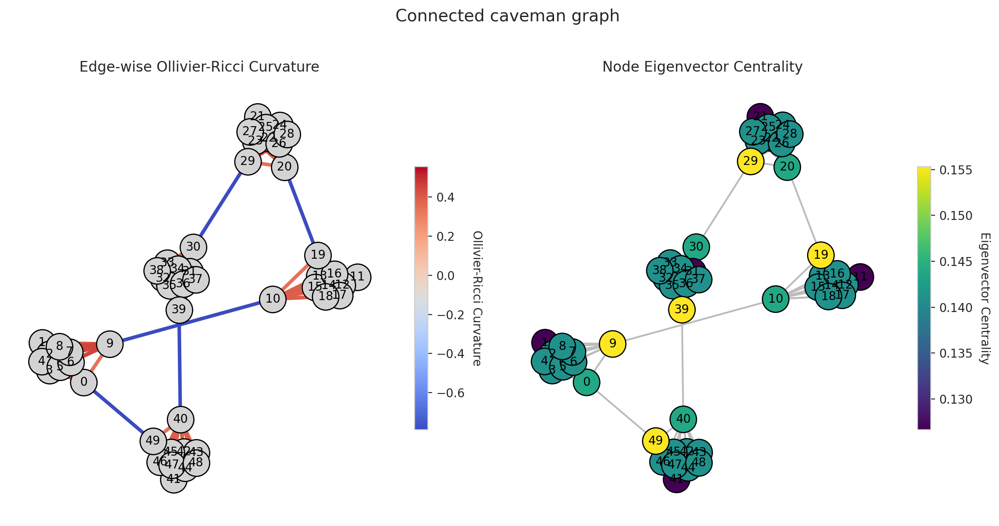

In [11]:
for label, G in graphs.items():
    print(label)

    # compute curvature
    orc = OllivierRicci(G, alpha=0.5)
    orc.compute_ricci_curvature()
    plot_curvature_and_centrality(G, G.pos, orc.G, suptitle=label)

# Connected Caveman Graphs


Connected Caveman: l=2, k=5 (n=10)


/tmp/ipykernel_2985866/78302605.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_c = cm.get_cmap("coolwarm")  # diverging colormap
/tmp/ipykernel_2985866/78302605.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_e = cm.get_cmap("viridis")


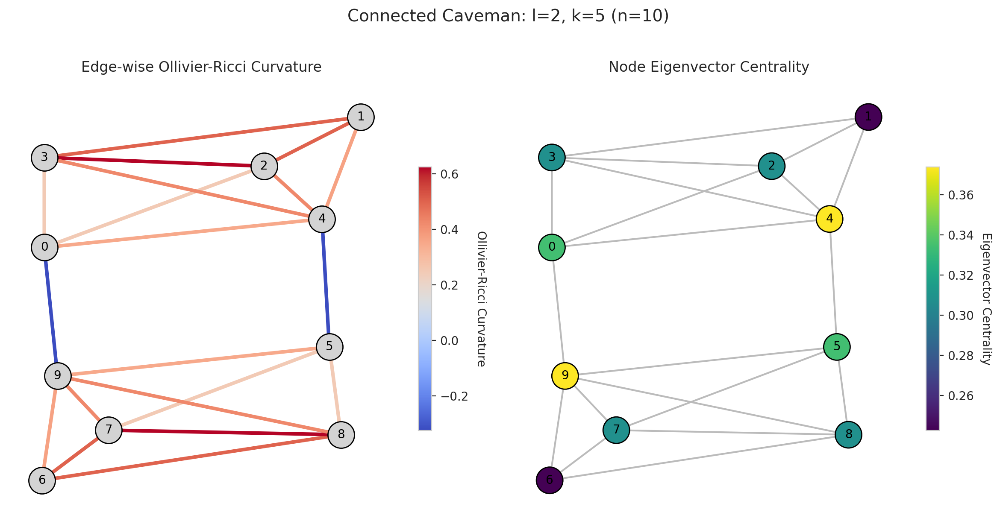


Connected Caveman: l=2, k=8 (n=16)


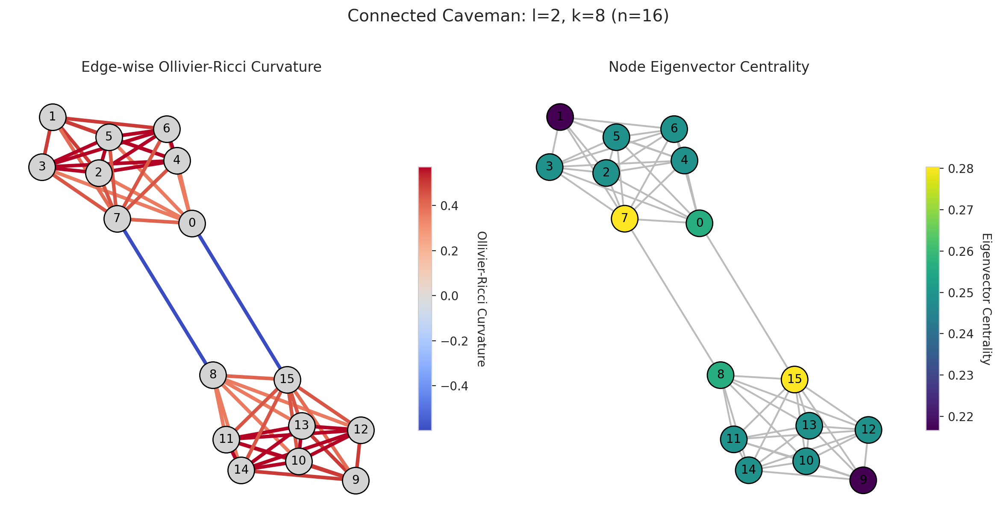


Connected Caveman: l=2, k=11 (n=22)


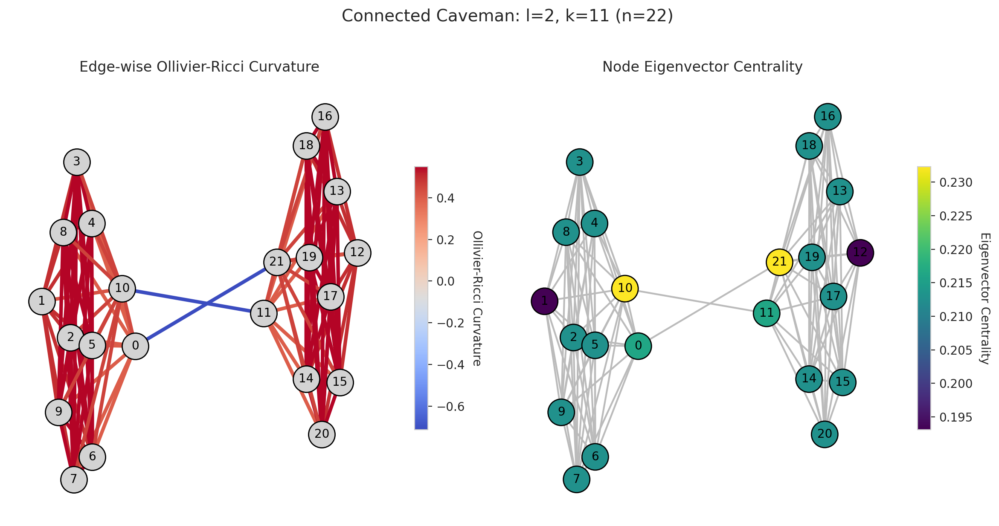


Connected Caveman: l=3, k=5 (n=15)


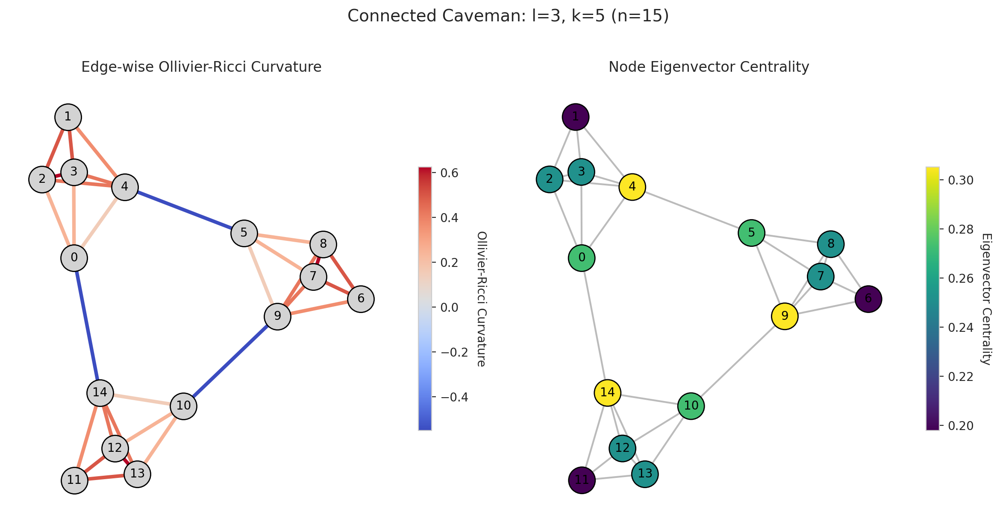


Connected Caveman: l=3, k=8 (n=24)


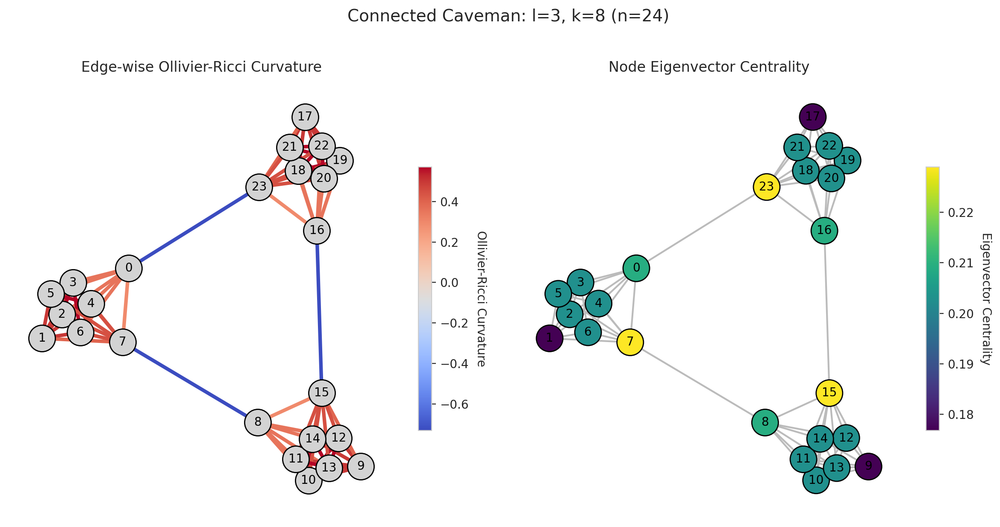


Connected Caveman: l=3, k=11 (n=33)


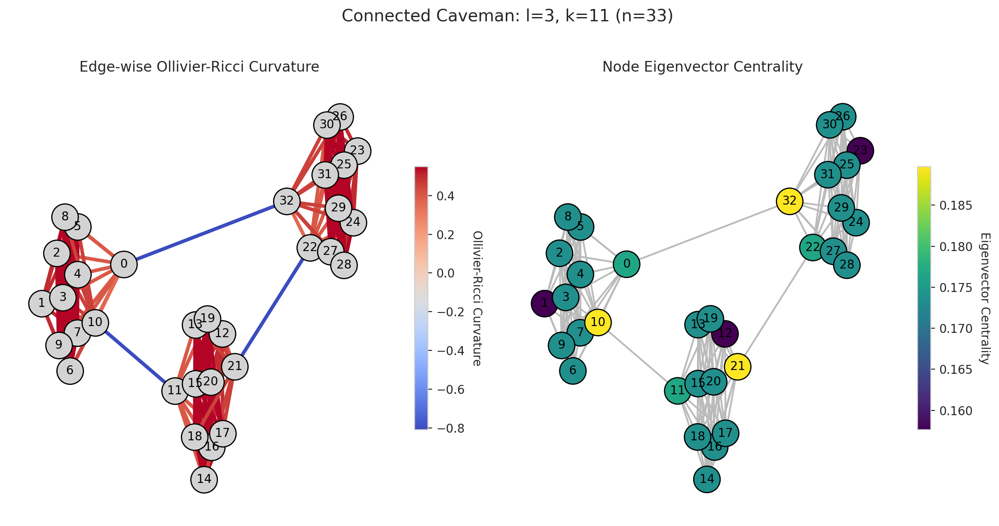


Connected Caveman: l=4, k=5 (n=20)


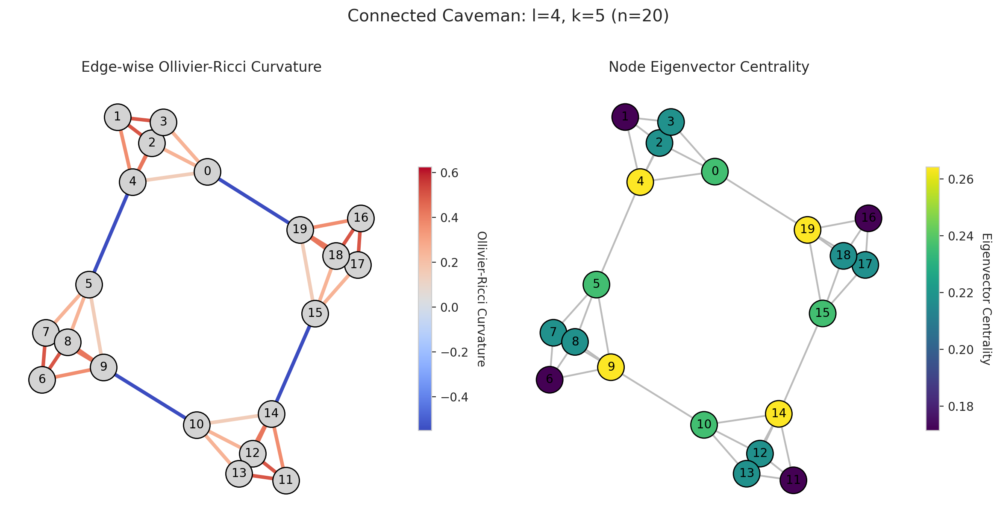


Connected Caveman: l=4, k=8 (n=32)


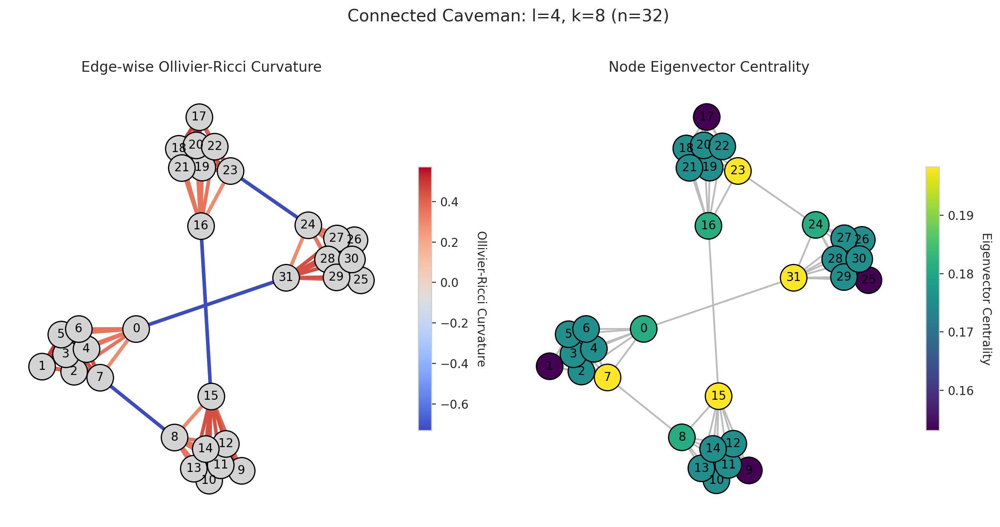


Connected Caveman: l=4, k=11 (n=44)


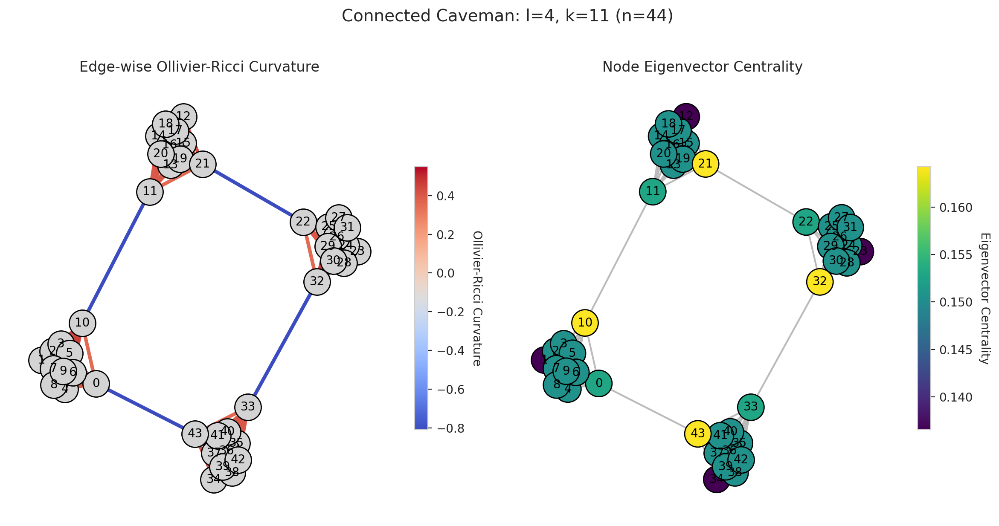

CPU times: user 4.43 s, sys: 6.74 s, total: 11.2 s
Wall time: 17 s


In [12]:
%%time
# Parameter ranges to sweep
l_values = [2, 3, 4,]      # number of cliques
k_values = [5, 8, 11]    # nodes per clique

# (Optional) cap total nodes to avoid huge graphs in a sweep
MAX_NODES = 100

for l, k in itertools.product(l_values, k_values):
    n = l * k
    if n > MAX_NODES:
        # skip overly large cases
        continue

    label = f"Connected Caveman: l={l}, k={k} (n={n})"
    print(f"\n{label}")

    # Generate graph and layout
    G = nx.connected_caveman_graph(l=l, k=k)
    pos = nx.spring_layout(G, seed=42)
    G.pos = pos

    # Compute Ollivier–Ricci curvature
    orc = OllivierRicci(G, alpha=0.5)
    orc.compute_ricci_curvature()

    # Plot (uses your existing function)
    plot_curvature_and_centrality(G, G.pos, orc.G, suptitle=label)

# Simulate CP networks

In [13]:
def generate_core_periphery_graph(n_core=10, n_periphery=20, p_core=0.8, p_cp=0.3, seed=None):
    """
    Generate a simple core-periphery graph.

    Parameters:
        n_core (int): Number of core nodes
        n_periphery (int): Number of periphery nodes
        p_core (float): Probability of edge between core-core nodes
        p_cp (float): Probability of edge between core and periphery nodes
        seed (int): Random seed

    Returns:
        G (networkx.Graph): Core-periphery graph
    """
    if seed is not None:
        random.seed(seed)

    G = nx.Graph()

    # Add nodes
    core_nodes = range(n_core)
    periphery_nodes = range(n_core, n_core + n_periphery)
    G.add_nodes_from(core_nodes, type="core")
    G.add_nodes_from(periphery_nodes, type="periphery")

    # Core-core edges
    for i in core_nodes:
        for j in core_nodes:
            if i < j and random.random() < p_core:
                G.add_edge(i, j)

    # Core-periphery edges
    for i in core_nodes:
        for j in periphery_nodes:
            if random.random() < p_cp:
                G.add_edge(i, j)

    # Optionally add no periphery-periphery edges (to enforce structure)
    return G

G = generate_core_periphery_graph()
print(G)

Graph with 30 nodes and 101 edges


Removing 6 isolated node(s).


/tmp/ipykernel_2985866/78302605.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_c = cm.get_cmap("coolwarm")  # diverging colormap
/tmp/ipykernel_2985866/78302605.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_e = cm.get_cmap("viridis")


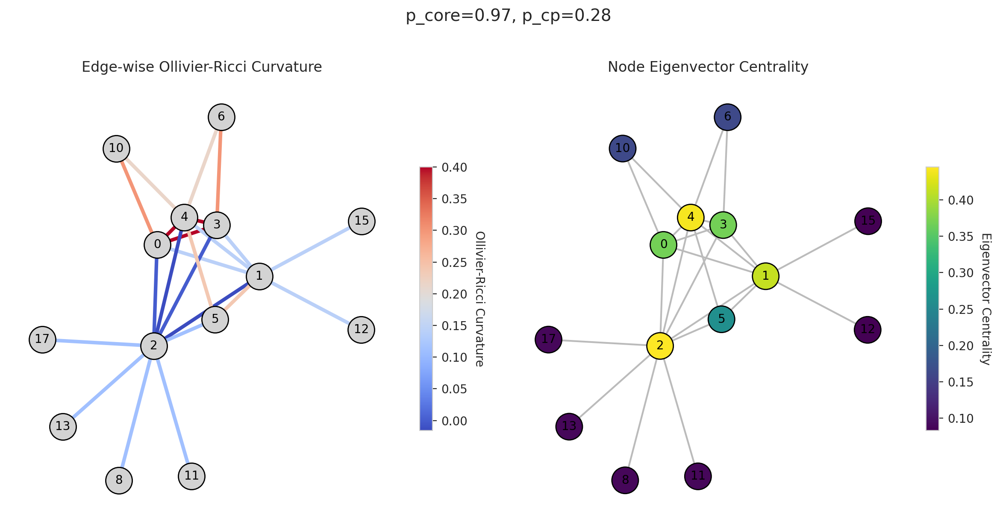

Removing 3 isolated node(s).


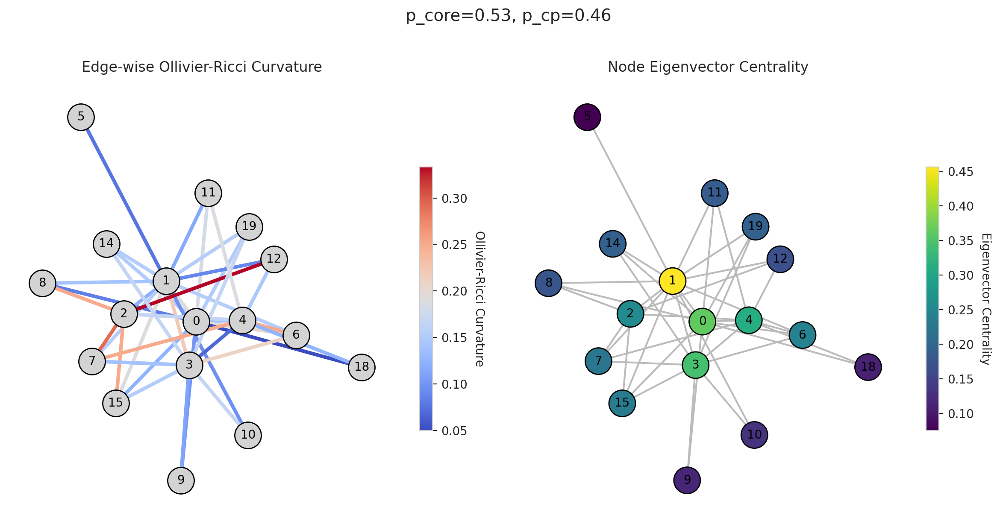

Removing 2 isolated node(s).


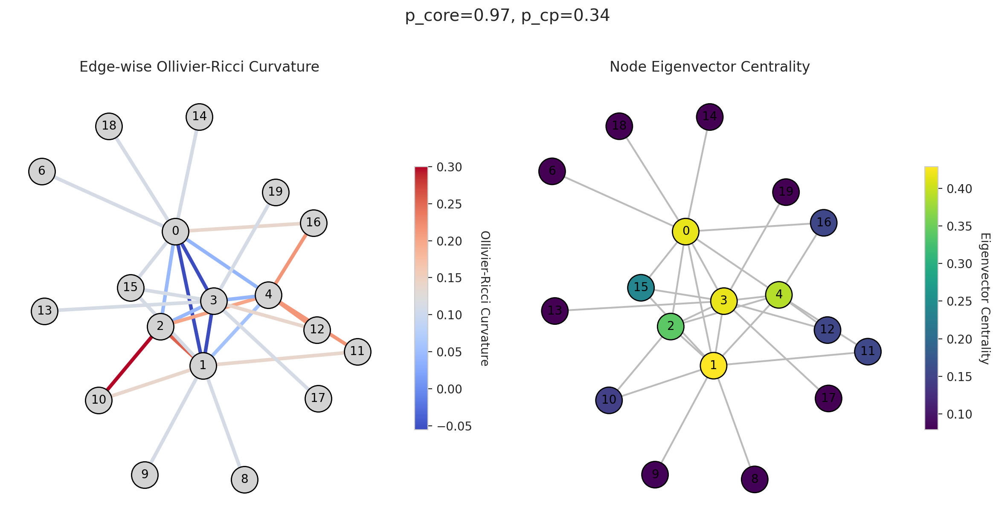

Removing 2 isolated node(s).


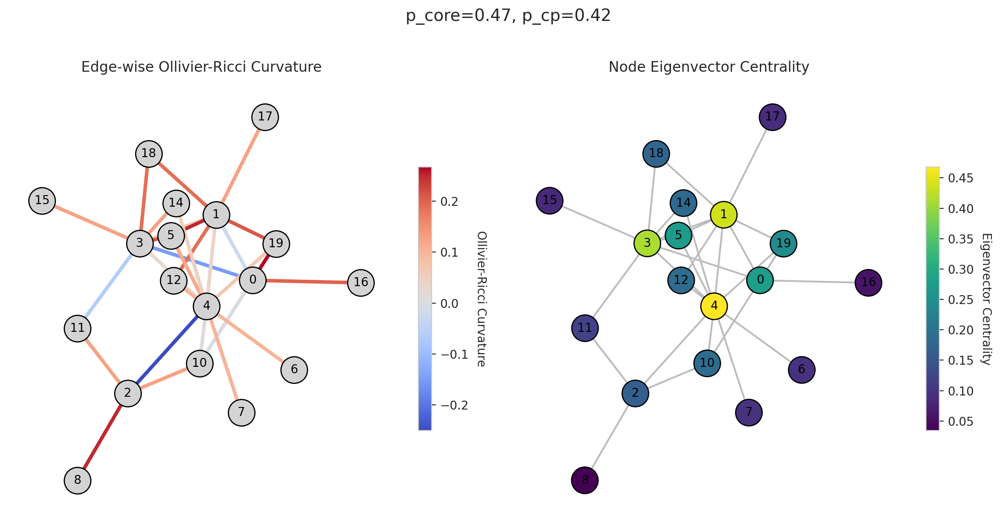

Removing 1 isolated node(s).


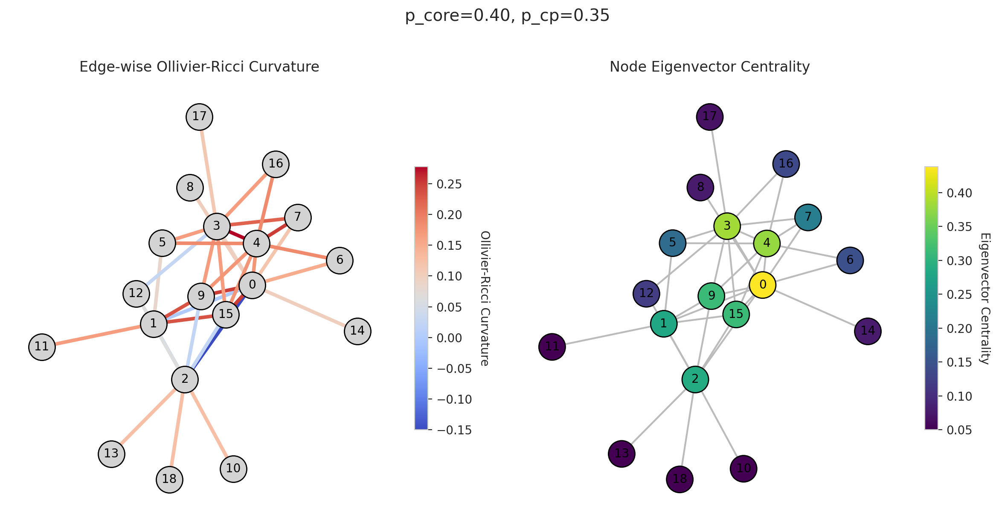

Removing 1 isolated node(s).


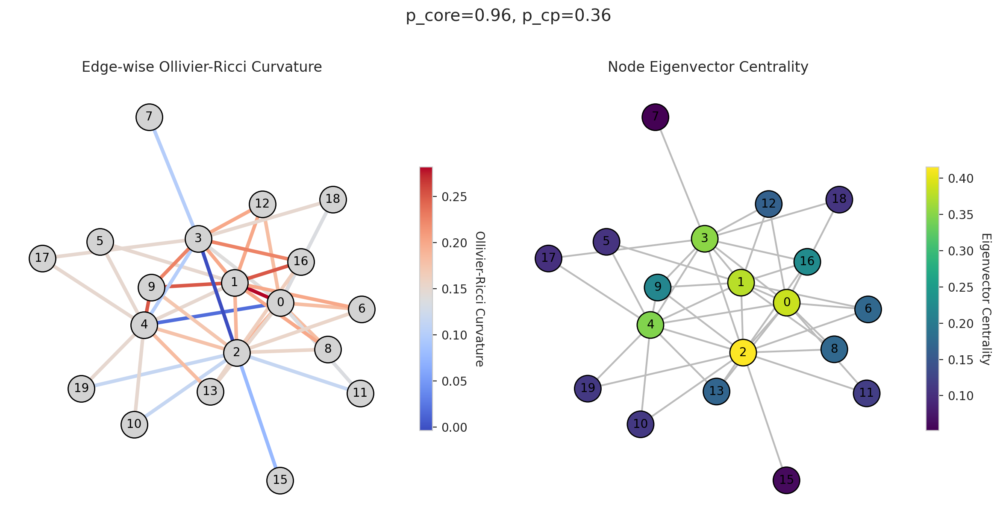

Removing 4 isolated node(s).


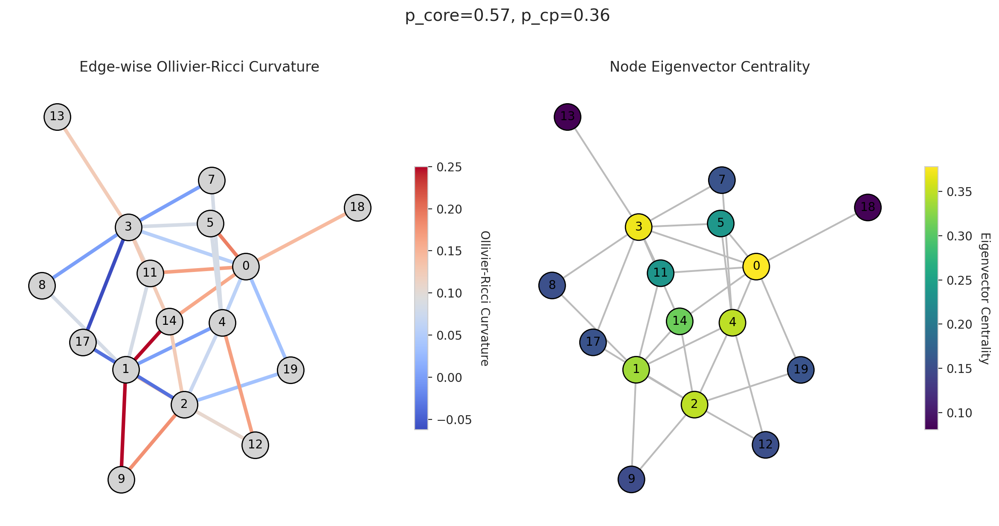

Removing 4 isolated node(s).


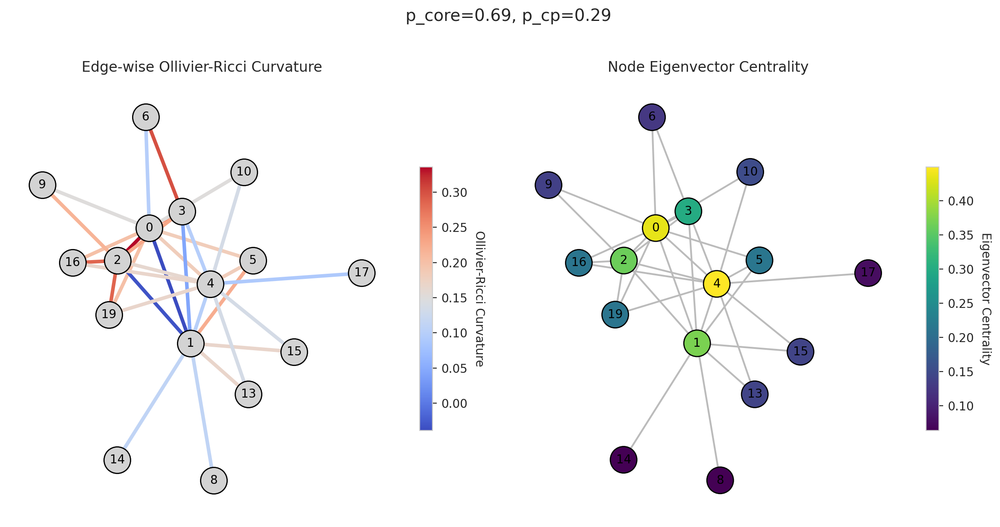

Removing 0 isolated node(s).


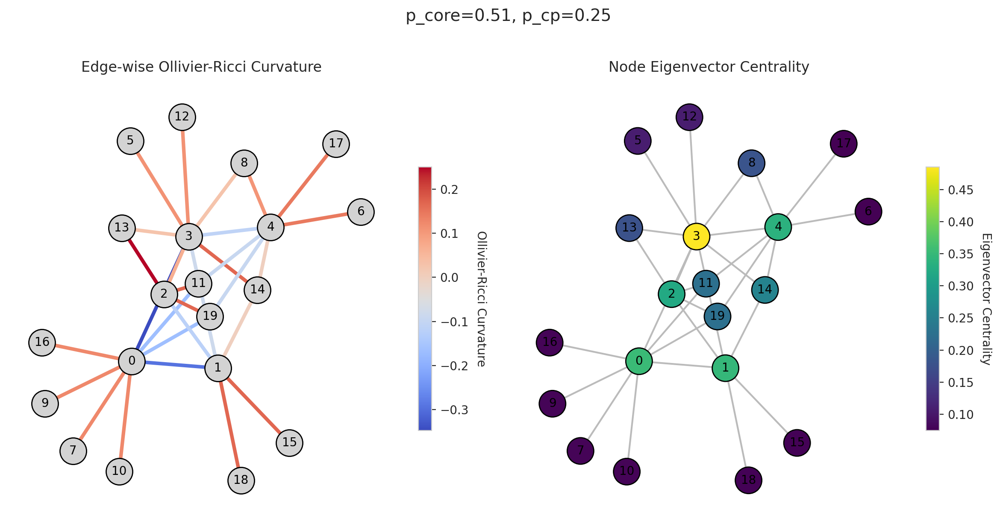

Removing 1 isolated node(s).


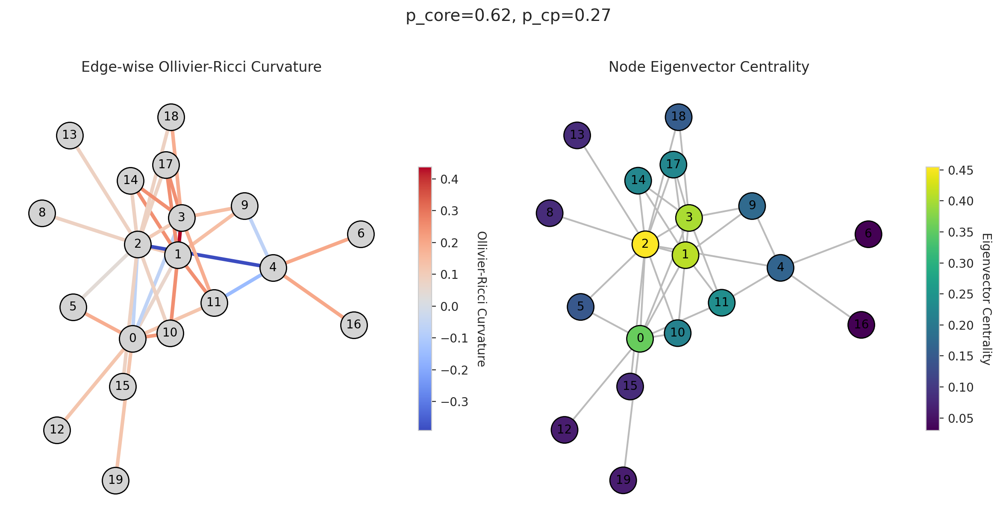

CPU times: user 4.75 s, sys: 7.28 s, total: 12 s
Wall time: 17.8 s


In [14]:
%%time
n_graphs = 10
graphs = []

for i in range(n_graphs):
    n_core = 5
    n_periphery = 15
    p_core = random.uniform(0.35, 1.0)
    p_cp = random.uniform(0.05, 0.55)
    seed = i

    G = generate_core_periphery_graph(
        n_core=n_core,
        n_periphery=n_periphery,
        p_core=p_core,
        p_cp=p_cp,
        seed=seed
    )

    # Remove isolated nodes from G
    isolated_nodes = list(nx.isolates(G))
    print(f"Removing {len(isolated_nodes)} isolated node(s).")
    G.remove_nodes_from(isolated_nodes)

    # positions
    G.pos = nx.spring_layout(G, seed=42)

    # curvature
    orc = OllivierRicci(G, alpha=0.5)
    orc.compute_ricci_curvature()

    label = f"p_core={p_core:.2f}, p_cp={p_cp:.2f}"
    plot_curvature_and_centrality(G, G.pos, orc.G, suptitle=label)